In [6]:
import zipfile

zfile = zipfile.ZipFile('/content/food-101.zip')
zfile.extractall('data')

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from keras.applications import InceptionV3
from keras.layers import Dense, Flatten, Conv2D, MaxPool2D
from keras.optimizers import Adam
from keras.models import Model, Sequential
from keras.losses import CategoricalCrossentropy
from keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix


In [8]:
import shutil
import os

In [46]:
shutil.rmtree('new_data')

In [48]:
os.mkdir('new_data')
images_path = '/content/data/food-101/food-101/images'
classes_folders = os.listdir(images_path)
classes_folders

['french_fries',
 'fried_rice',
 'ice_cream',
 'ramen',
 'french_onion_soup',
 'risotto',
 'sushi',
 'seaweed_salad',
 'carrot_cake',
 'pad_thai',
 'pizza',
 'tiramisu',
 'bruschetta',
 'baklava',
 'beet_salad',
 'mussels',
 'foie_gras',
 'spaghetti_bolognese',
 'greek_salad',
 'pulled_pork_sandwich',
 'hot_dog',
 'deviled_eggs',
 'spaghetti_carbonara',
 'onion_rings',
 'hummus',
 'hot_and_sour_soup',
 'filet_mignon',
 'ravioli',
 'lobster_roll_sandwich',
 'fish_and_chips',
 'caesar_salad',
 'churros',
 'chicken_wings',
 'grilled_salmon',
 'donuts',
 'red_velvet_cake',
 'samosa',
 'peking_duck',
 'cup_cakes',
 'pork_chop',
 'nachos',
 'creme_brulee',
 'beignets',
 'tacos',
 'strawberry_shortcake',
 'chicken_quesadilla',
 'falafel',
 'grilled_cheese_sandwich',
 'pancakes',
 'gnocchi',
 'scallops',
 'edamame',
 'ceviche',
 'bread_pudding',
 'miso_soup',
 'cheese_plate',
 'chicken_curry',
 'baby_back_ribs',
 'pho',
 'chocolate_mousse',
 'bibimbap',
 'lasagna',
 'huevos_rancheros',
 'waffl

In [49]:
for class_name in classes_folders:
  os.mkdir(f'new_data/{class_name}')
  if class_name == '.DS_Store':
    continue
  imgs_pathes = os.listdir(os.path.join(images_path, class_name))

  for n in range(500):
    shutil.copy(os.path.join(images_path, class_name, imgs_pathes[n]), f'new_data/{class_name}')

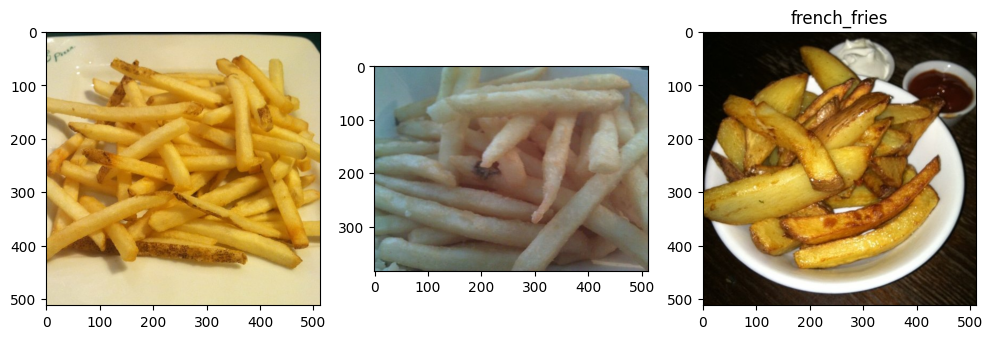

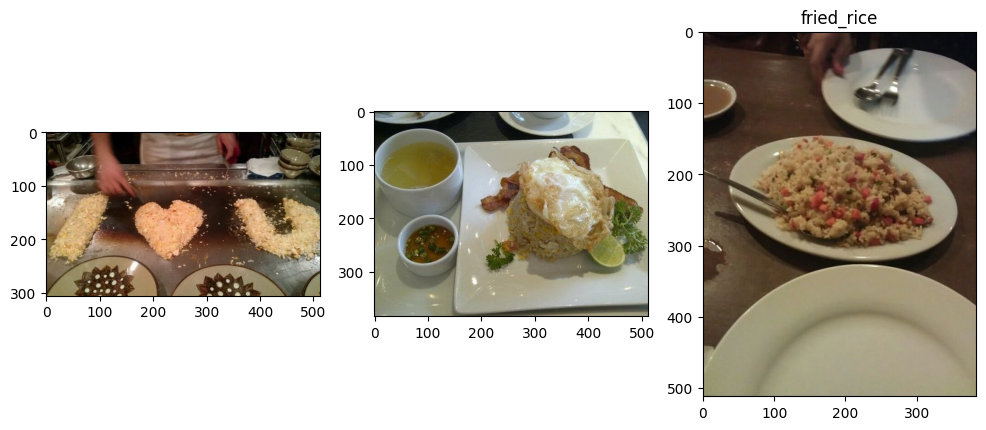

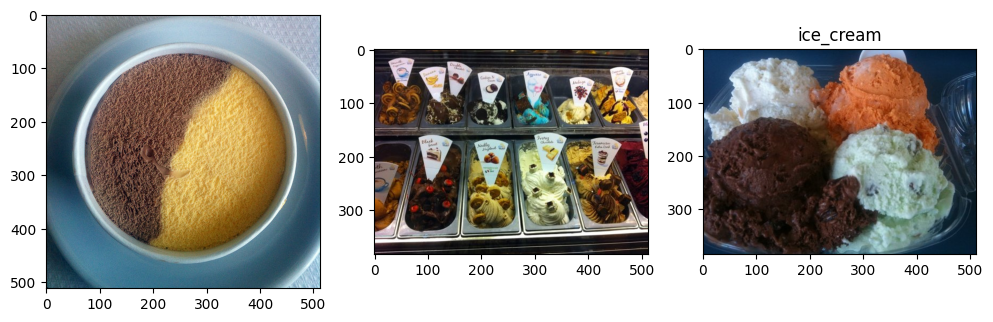

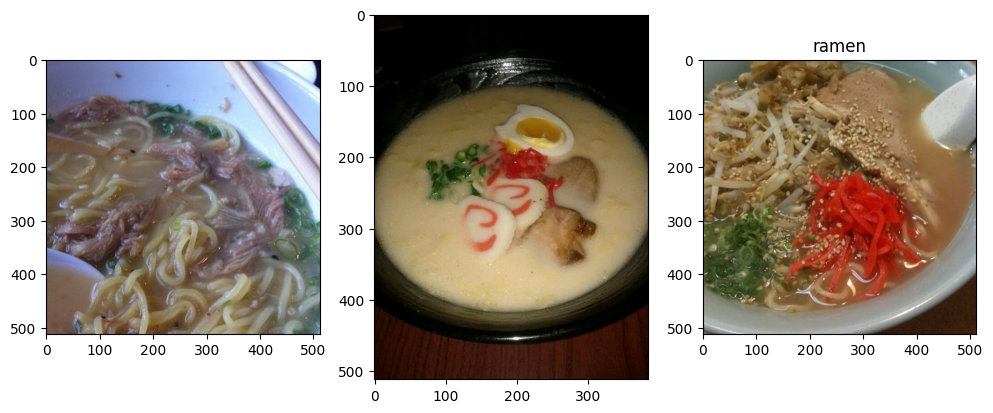

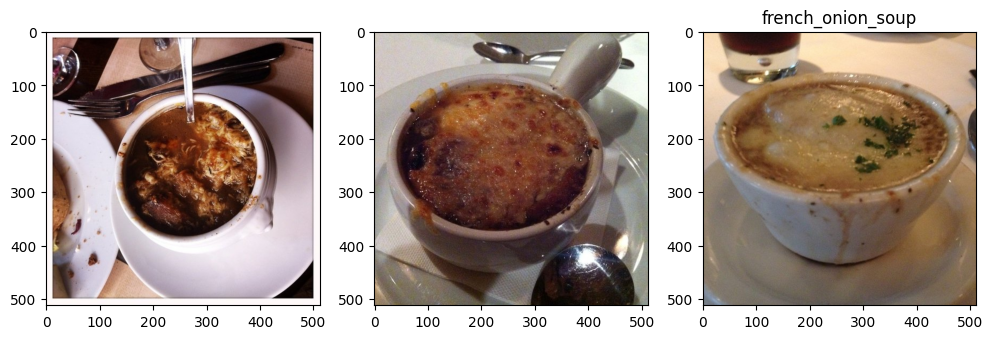

...

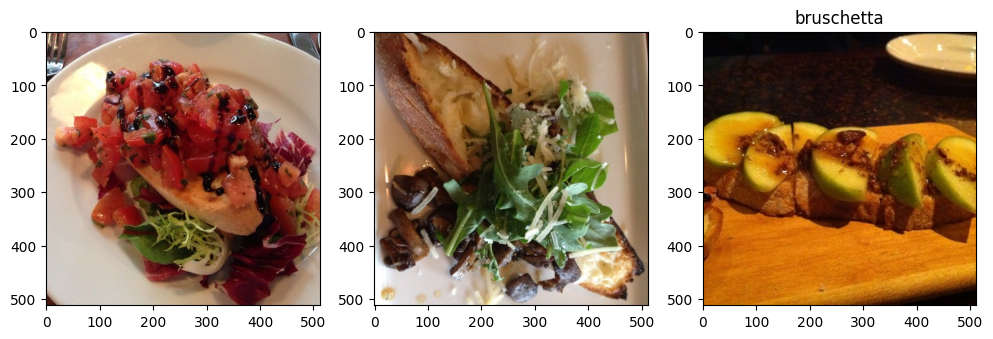

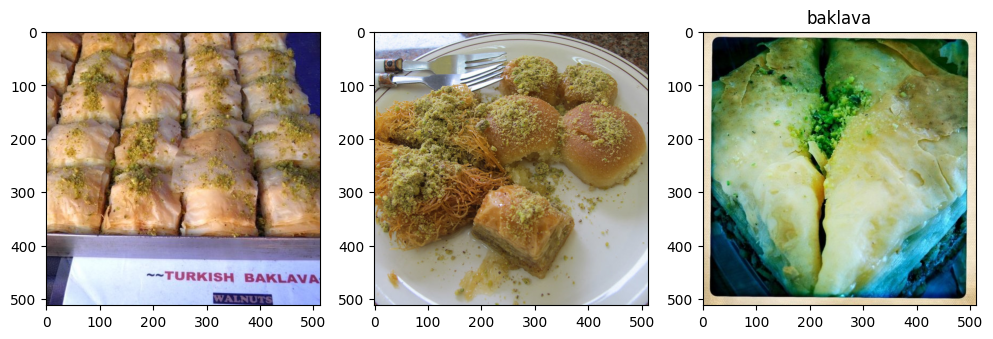

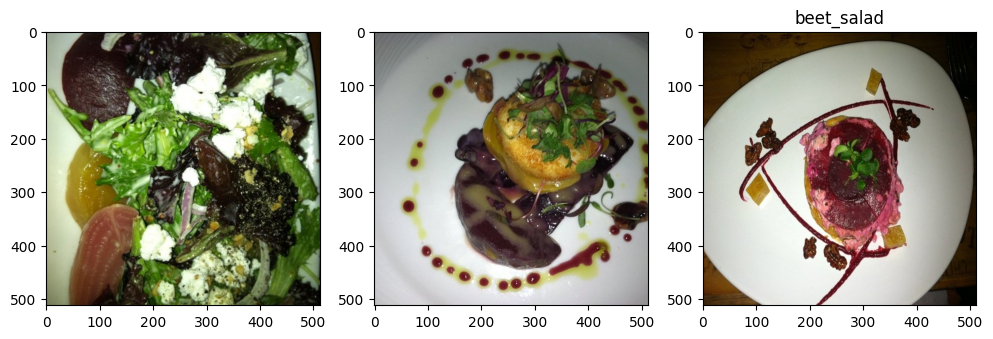

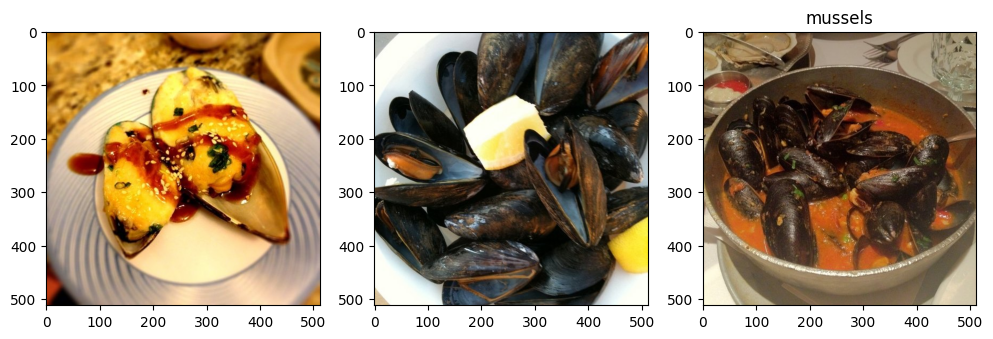

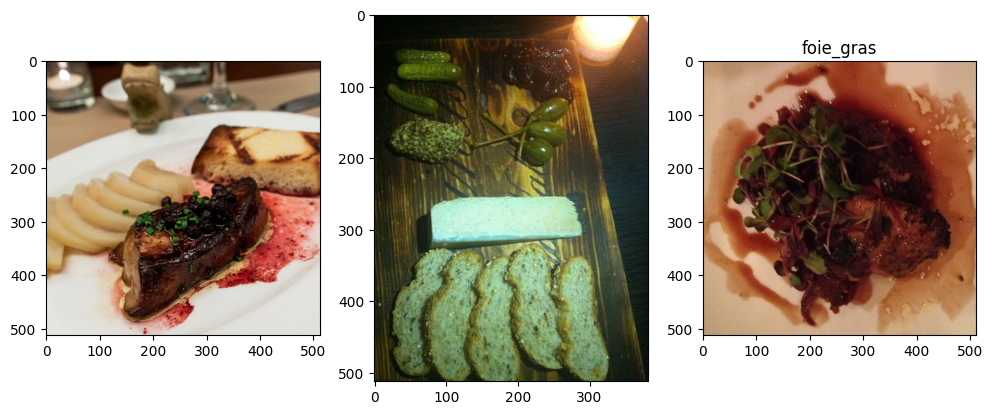

In [ ]:
FILE_NAME = '/content/new_data'
for folder in os.listdir(FILE_NAME):
  fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(12, 8))
  images = os.listdir(FILE_NAME + '/' +folder)
  ax[0].imshow(plt.imread(FILE_NAME+ f'/{folder}/' + images[4]), cmap='gray')
  ax[1].imshow(plt.imread(FILE_NAME+ f'/{folder}/' + images[2]), cmap='gray')
  ax[2].imshow(plt.imread(FILE_NAME+ f'/{folder}/' + images[3]), cmap='gray')
  plt.title(f'{folder}')
  plt.show()

In [42]:
# shutil.rmtree('Data')
shutil.rmtree('training_data')

In [50]:
classes_lst = ['hot_dog', 'donuts','falafel',
               'steak']

os.mkdir('training_data')
for class_name in classes_lst:

    shutil.move(f"new_data/{class_name}", "training_data")


In [71]:
from splitfolders import ratio

ratio('training_data', output='Data')

Copying files: 1000 files [00:00, 6244.81 files/s]


In [70]:

shutil.rmtree('Data')


In [72]:
train_gen = ImageDataGenerator(rescale=1./255,
                               zoom_range=30,
                               vertical_flip=True)
train_data = train_gen.flow_from_directory('/content/Data/train',
                                           class_mode='categorical',
                                           batch_size=32,
                                           target_size=(150, 150))

test_gen = ImageDataGenerator(rescale=1./255)
test_data = test_gen.flow_from_directory('/content/Data/test',
                                           class_mode='categorical',
                                           batch_size=32,
                                          target_size=(150, 150))


val_gen = ImageDataGenerator(rescale=1./255)
val_data = val_gen.flow_from_directory('/content/Data/val',
                                           class_mode='categorical',
                                           batch_size=32,
                                          target_size=(150, 150))

Found 800 images belonging to 2 classes.
Found 100 images belonging to 2 classes.
Found 100 images belonging to 2 classes.


# -> Build the model

In [79]:
pre_trained_model = InceptionV3(include_top=False, input_shape=(150, 150, 3))

for layer in pre_trained_model.layers:
  layer.trainable = False


last_layer = pre_trained_model.get_layer('mixed7')
x = Flatten()(last_layer.output)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
x = Dense(2, activation='softmax')(x)

model = Model(inputs=pre_trained_model.input, outputs=x)

In [83]:
opt = Adam(learning_rate=0.001)
loss = CategoricalCrossentropy()

model.compile(optimizer=opt, loss=loss, metrics=['acc'])

hist = model.fit(train_data, validation_data=val_data, epochs=5, batch_size=32)

Epoch 1/5
25/25 [==============================] - 13s 343ms/step - loss: 0.6158 - acc: 0.6575 - val_loss: 0.2739 - val_acc: 0.8800
Epoch 2/5
25/25 [==============================] - 7s 263ms/step - loss: 0.6090 - acc: 0.6587 - val_loss: 0.3033 - val_acc: 0.8800
Epoch 3/5
25/25 [==============================] - 7s 265ms/step - loss: 0.5973 - acc: 0.6712 - val_loss: 0.3305 - val_acc: 0.8600
Epoch 4/5
25/25 [==============================] - 8s 312ms/step - loss: 0.5824 - acc: 0.7025 - val_loss: 0.2826 - val_acc: 0.8700
Epoch 5/5
25/25 [==============================] - 6s 259ms/step - loss: 0.5617 - acc: 0.6925 - val_loss: 0.2889 - val_acc: 0.8900


In [86]:
print("test acuraccy:", model.evaluate(test_data)[1])

4/4 [==============================] - 0s 94ms/step - loss: 0.2893 - acc: 0.8900
test acuraccy: 0.8899999856948853


In [30]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 conv2d_282 (Conv2D)         (None, 74, 74, 32)           864       ['input_4[0][0]']             
                                                                                                  
 batch_normalization_282 (B  (None, 74, 74, 32)           96        ['conv2d_282[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_282 (Activation  (None, 74, 74, 32)           0         ['batch_normalization_28